# Monte Carlo Approach
Monte Carlo methods are any process that consumes random numbers. These are part of computational algorithms which are based on random sampling to obtain numerical results. Monte Carlo methods are proved to be a very valuable and flexible computational tool in finance and is one of the most widely used methods for optimization and numerical integration problems.

These methods are widely used in high dimensional problems; pricing exotics and complex derivatives where closed form solutions are not directly available. Monte Carlo methods are not just adapted in pricing complex derivatives, It is also extensively used in estimating the portfolio risk such as Value-at-Risk and Expected Shortfall and used in the calculation of worst-case scenarios in stress testing. The downside to that is, it is very computational intensive and demanding.



# Monte Carlo Simulation
A method of estimating the value of an unknown quantity using the principles of inferential statistics.

We take the population and then we sample it by drawing a proper subset. And then we make an inference about the population based upon some set of statistics we do on the sample.

And, the key fact that makes them work, that if we choose the sample at random, the sample will tend to exhibit the same properties as the population from which it is drawn.

# Option Pricing Techniques
As with other option pricing techniques Monte Carlo methods are used to price options using what is essentially a three step process.

**Step 1:** Simulate potential price paths of the underlying asset.

**Step 2:** Calculate the option payoff for each of these price paths.

**Step 3:** Average the payoff and discount back to today to determine the option price.

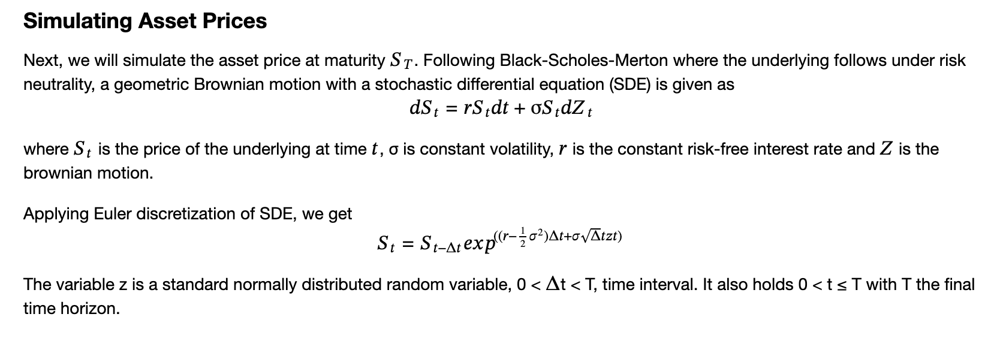

In [2]:
# Importing libraries
import pandas as pd
from numpy import *

# Libraries for plotting
import matplotlib.pyplot as plt
import cufflinks as cf
cf.set_config_file(offline=True)

# Set max row to 300
pd.set_option('display.max_rows', 300)

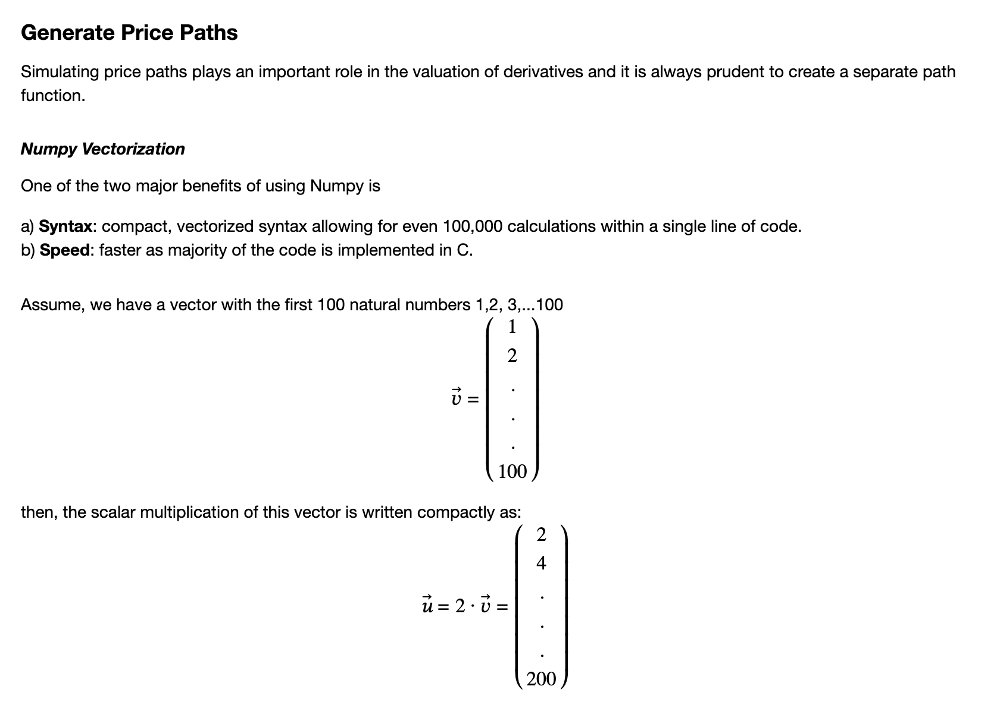

In [3]:
# define an array
v = arange(1,10)
v

array([1, 2, 3, 4, 5, 6, 7, 8, 9])

In [4]:
# scalar multiplication
2*v

array([ 2,  4,  6,  8, 10, 12, 14, 16, 18])

In [5]:
def simulate_path(s0, mu, sigma, horizon, timesteps, n_sims):
    
    # Set the random seed for reproducibility
    # Same seed leads to the same set of random values
    random.seed(10000) 

    # Read parameters
    S0 = s0         # initial spot level
    r = mu          # mu = rf in risk neutral framework 
    T = horizon     # time horizion
    t = timesteps   # number of time steps
    n = n_sims      # number of simulation
    
    # Define dt
    dt = T/t        # length of time interval  
    
    # Simulating 'n' asset price paths with 't' timesteps
    S = zeros((t+1, n))
    S[0] = 100.

    for i in range(1, t+1):
        z = random.standard_normal(n)     # psuedo random numbers
        S[i] = S[i-1] * exp((r - 0.5 * sigma ** 2) * dt + sigma * sqrt(dt) * z) # vectorized operation per timesteps
        
    return S

In [6]:
zt = random.standard_normal(100000)
zt.shape

(100000,)

In [7]:
spath = simulate_path(100,0.05,0.2,1,252,100000)
spath.shape

(253, 100000)

In [8]:
# Random numbers drawn from a standard normal distribution
random.seed(10000) 
z_sn = random.standard_normal(100000)
z_sn.shape, z_sn.mean(), z_sn.std()

((100000,), 0.0015478685920003361, 0.9999493876956002)

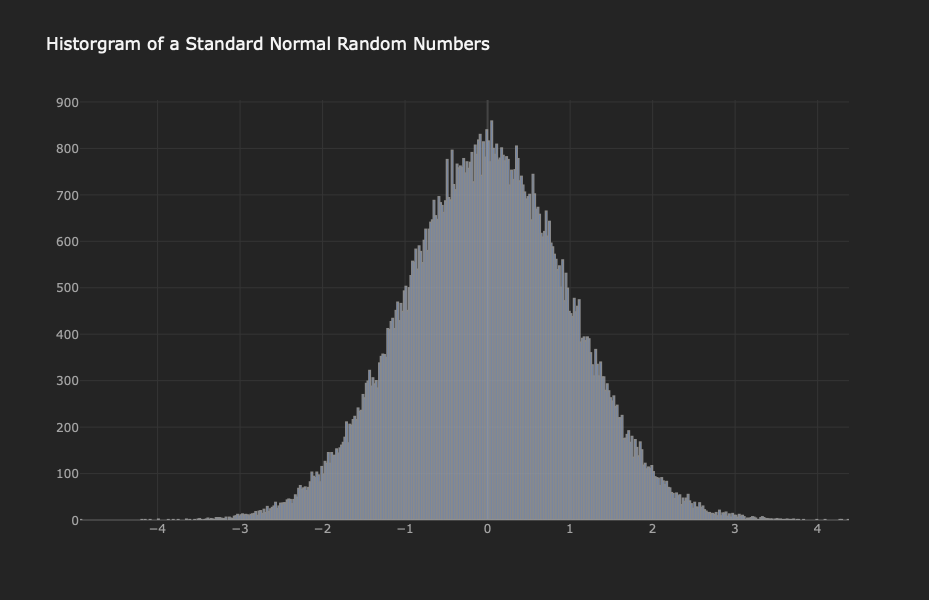

In [9]:
pd.DataFrame(random.standard_normal(100000)).iplot(kind='histogram', 
                                                   title = 'Historgram of a Standard Normal Random Numbers', 
                                                   color ='cornflowerblue') 

In [10]:
# Assign simulated price path to dataframe for analysis and plotting
price_path = pd.DataFrame(simulate_path(100, 0.05, 0.20, 1, 252, 100000))

# Verify the generated price paths
price_path.tail()

,0,1,2,3,4,5,6,7,8,9,...,99990,99991,99992,99993,99994,99995,99996,99997,99998,99999
248,122.744116,73.726256,130.300175,85.189213,97.832185,145.078927,80.238957,115.570249,146.166446,92.363360,...,115.268251,97.785460,77.997978,125.746500,66.248592,101.359439,98.117755,106.427116,116.403264,88.053283
249,123.481394,75.683974,129.657857,83.829975,98.647390,145.796634,79.768302,115.431777,143.233227,92.761168,...,113.820214,98.806408,78.179687,123.540823,67.150401,102.689798,97.286120,107.246420,117.029213,88.093302
250,120.425574,74.540613,129.857575,83.173612,99.329872,145.326902,79.856524,114.917017,145.739873,94.496627,...,112.924580,100.028868,79.705226,123.337220,67.575219,102.027625,97.845233,105.380055,119.285472,90.154848
251,121.041764,74.274111,130.494232,82.587781,97.291661,143.060354,80.695230,111.935555,147.320979,95.150662,...,112.504629,99.577606,80.501443,122.850952,66.989567,102.092763,98.906659,107.483858,119.385760,86.898010
252,119.614091,76.158298,129.412627,81.065594,98.140474,143.715903,82.260569,111.930403,149.914686,94.996926,...,113.464643,99.783934,81.659347,124.103865,66.765986,102.196988,98.788117,107.454989,122.229576,86.254176


## Histogram of Simulated Paths

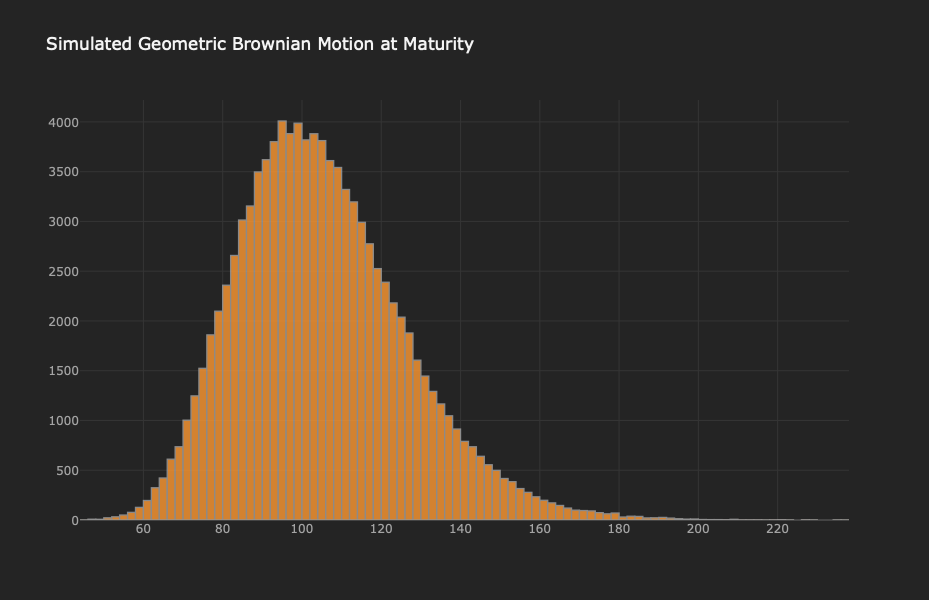

In [11]:
# Plot the histogram of the simulated price path at maturity
price_path.iloc[-1].iplot(kind='histogram', title= 'Simulated Geometric Brownian Motion at Maturity', bins=100)

## Visualization of Simulated Paths

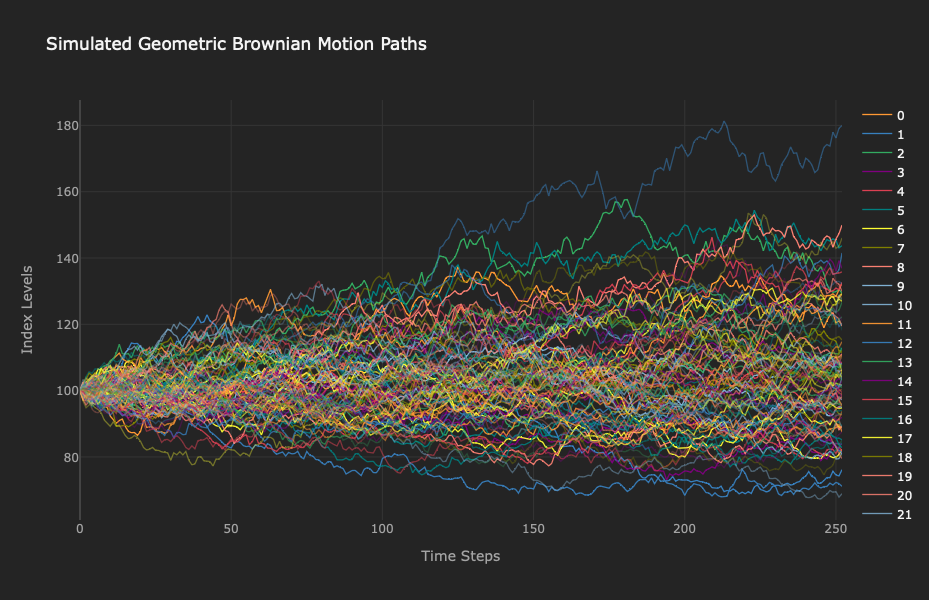

In [12]:
# Plot simulated price paths 
price_path.iloc[:,:100].iplot(title='Simulated Geometric Brownian Motion Paths', xTitle='Time Steps', yTitle='Index Levels')

In [14]:
# # Plot initial 100 simulated path using matplotlib
# S =  simulate_path(100, 0.05, 0.20, 1, 252, 100000)
# plt.plot(S[:,:100])
# plt.grid(True)
# plt.xlabel('time steps')
# plt.xlim(0,252)
# plt.ylabel('index levels')
# plt.title('Monte Carlo Simulated Asset Prices');

## Variance Reduction
Monte Carlo methods are simulation algorithms to estimate a numerical quantity in a statistical model. There are few methods that provide for high accurary. Variance reduction techniques such as a) antithetic variates, b) control variates and c) moment matching are widely adopted.

In antithetic variates, we try to reduce the variance by introducing negative dependence between pairs of random draws while in moment matching, we correct the set of standard normal pseudo-random numbers generated by Python to match the first two moments correctly. In control variates method, we exploit information about the errors in estimates of known quantities to reduce the error of an estimate of an unknown quantity.

## Do pseudorandom numbers exhibit desired properties?
Python functions generate pseudorandom numbers that might exhibit the expected statistical behaviour. We try to achieve the desired property by employing variance reduction techniques.

In [15]:
# Define Parameters
n = 100000

z = random.standard_normal(100000) 
z.mean(), z.std()

(-0.0013212338752583515, 1.0038084669874554)

## Without Antithetic Variates

In [16]:
print ("%11s %11s" % ('Mean', 'Std. Deviation'))
print (31 * "-")

for i in range(1, 11):
    random.seed(10000) 
    sn = random.standard_normal(i**2*10000)
    print("%15.12f %15.12f" % (sn.mean(), sn.std()))

       Mean Std. Deviation
-------------------------------
-0.007599646936  0.993952113627
 0.002172884539  0.998313345022
 0.002225583121  1.000217645410
-0.000111961560  0.998652583104
-0.002467749429  0.998560787725
-0.001323351787  0.999106892333
-0.003065752578  0.998807812778
-0.002555368674  0.998763344066
-0.001532005844  0.999146506311
-0.001364771400  0.999371817155


In [17]:
print('Without Antithetic Variates')
print('Mean ', sn.mean())
print('Standard deviation', sn.std())

Without Antithetic Variates
Mean  -0.0013647713997682277
Standard deviation 0.9993718171552612


## With Antithetic Variates

In [19]:
print ("%11s %11s" % ('Mean', 'Std. Deviation'))
print (31 * "-")

for i in range(1, 11):
    random.seed(10000) 
    sn = random.standard_normal(int(i**2*10000/2))
    sna = concatenate((sn,-sn), axis=0)
    print("%15.12f %15.12f" % (sna.mean(), sna.std()))

       Mean Std. Deviation
-------------------------------
-0.000000000000  0.992666333135
-0.000000000000  0.996307849803
-0.000000000000  0.997410035672
-0.000000000000  1.000276630789
-0.000000000000  0.998282781298
 0.000000000000  0.998462027560
 0.000000000000  0.998205464660
 0.000000000000  0.998713653167
 0.000000000000  0.999213411064
 0.000000000000  0.998796747062


In [20]:
print('With Antithetic Variates')
print('Mean ', sna.mean())
print('Standard deviation', sna.std())

With Antithetic Variates
Mean  1.8829382497642655e-19
Standard deviation 0.9987967470615127


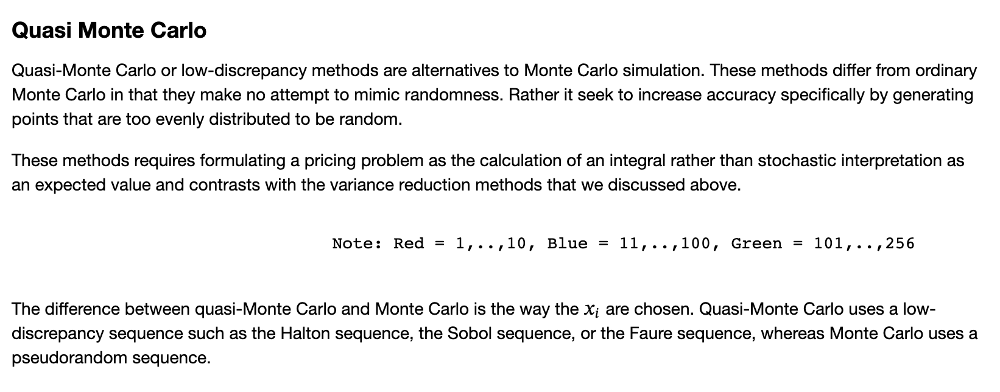

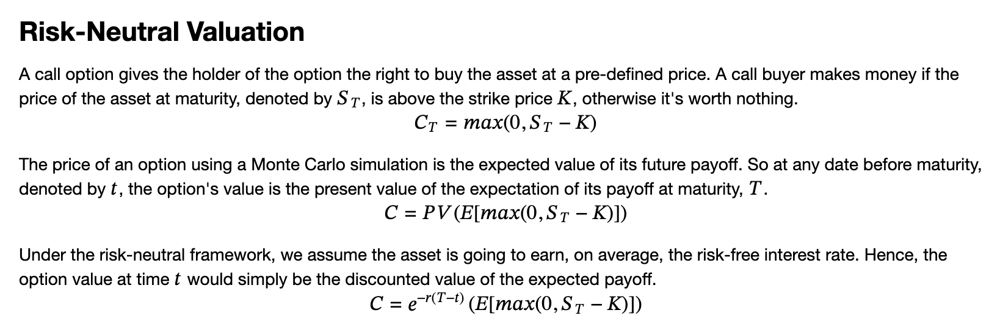

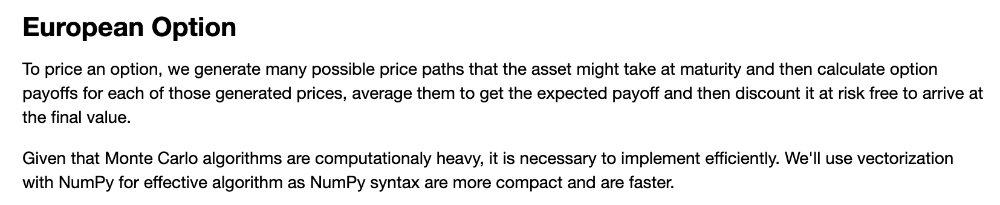

In [21]:
S = simulate_path(100, 0.05, 0.20, 1, 252, 100000)
S[-1]

array([119.61409108,  76.15829806, 129.41262743, ..., 107.45498894,
       122.22957645,  86.25417639])

In [22]:
# Call the simulation function
S = simulate_path(100, 0.05, 0.20, 1, 252, 100000)

# Define parameters
K = 100.; r = 0.05; T = 1

# Calculate the discounted value of the expeced payoff
C0 = exp(-r*T) * mean(maximum(S[-1] - K, 0))
P0 = exp(-r*T) * mean(maximum(K - S[-1], 0))

# Print the values
print(f'European Call Option Value: {C0:0.4f}')
print(f'European Put Option Value: {P0:0.4f}')


European Call Option Value: 10.3970
European Put Option Value: 5.5936


## Visualization of Option Payoff

In [23]:
# range of spot prices 
payoff = pd.DataFrame({'Index Level': arange(150)})
payoff['Call Value'] = maximum(0, payoff['Index Level'] - 100)
payoff['Put Value'] = maximum(0, 100 - payoff['Index Level'])

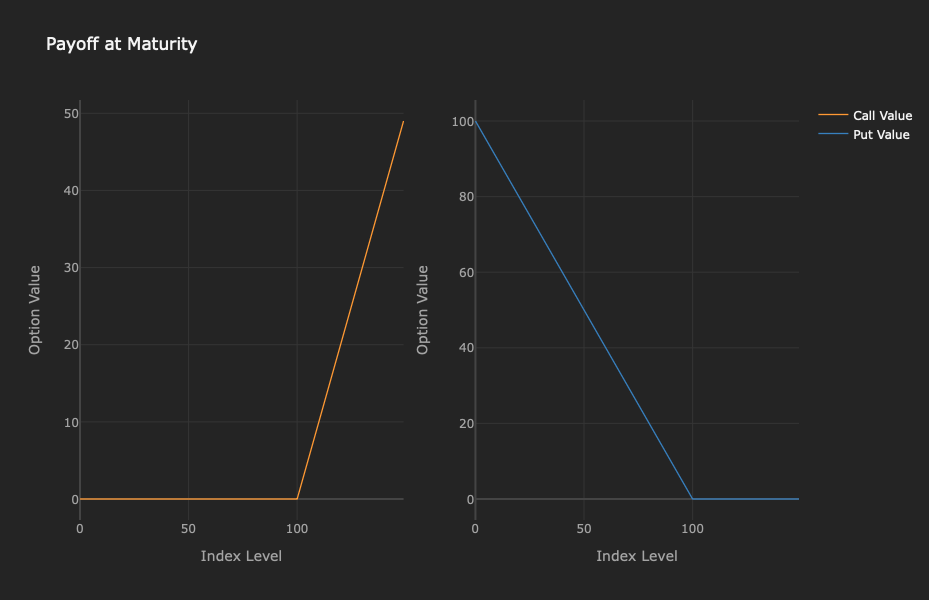

In [24]:
payoff[['Call Value', 'Put Value']].iplot(title = 'Payoff at Maturity', 
                                          xTitle='Index Level', yTitle='Option Value',
                                          subplots=True)

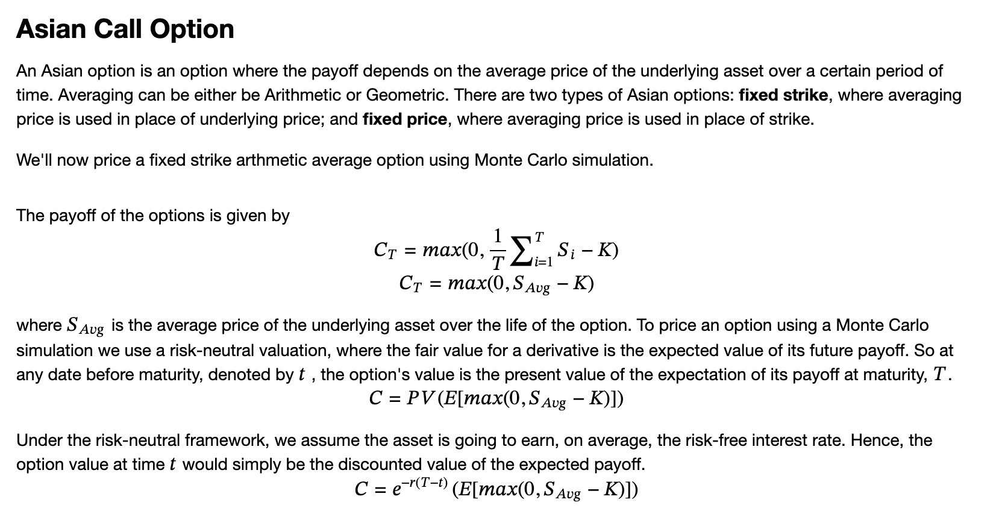

In [26]:
# Call the simulation function
S = simulate_path(100, 0.05, 0.20, 1, 252, 100000)

# Define parameters
K = 100.; r = 0.05; T = 1

# Average price
A = S.mean(axis=0)   
    
# Calculate the discounted value of the expeced payoff
C0 = exp(-r*T) * mean(maximum(A - K, 0))
P0 = exp(-r*T) * mean(maximum(K - A, 0))

# Print the values
print(f'Asian Call Option Value: {C0:0.4f}')
print(f'Asian Put Option Value: {P0:0.4f}')

Asian Call Option Value: 5.7360
Asian Put Option Value: 3.3370


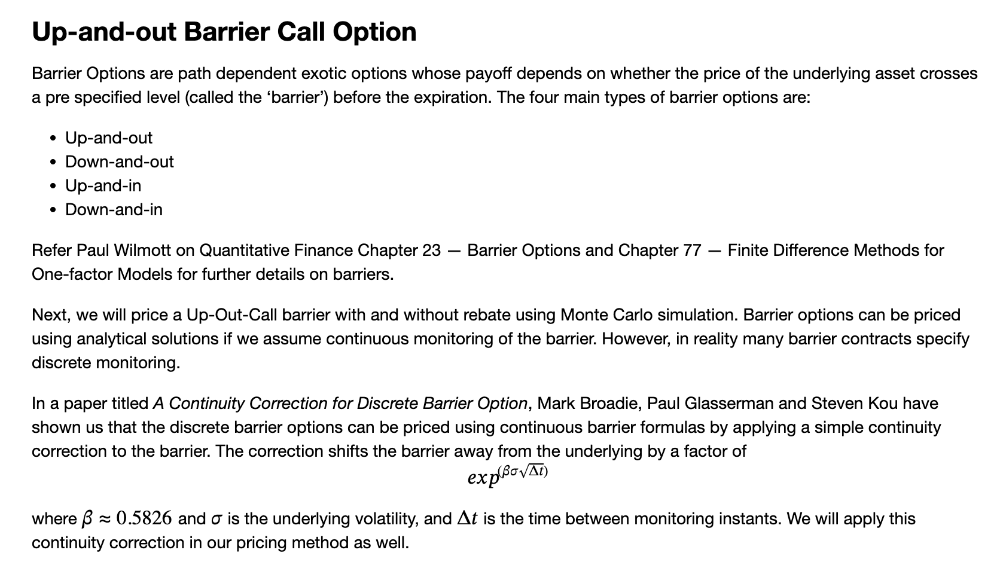

In [27]:
# Call the simulation function
S = simulate_path(100, 0.05, 0.20, 1, 252, 100000)

# Define parameters
K = 100.; B = 150.; r = 0.05; sigma = 0.20; T = 1; t = 252; dt = T/t; value = 0; rebate = 50; n = 100000

# Barrier shift - continuity correction for discrete monitoring
B_shift = B * exp(0.5826 * sigma * sqrt(dt))

for i in range(n):
    if S[:,i].max() < B_shift:
        value += maximum(S[-1,i] - K, 0)
    else:
        value += rebate
    
# Calculate the discounted value of the expeced payoff
C0 = exp(-r*T) * value / n

# Print the values #coggit.com/freetools
print(f'Up-and-out Barrier Call Option Value: {C0:0.4f}')

Up-and-out Barrier Call Option Value: 10.2066


In [28]:
B_shift

151.10506116164294

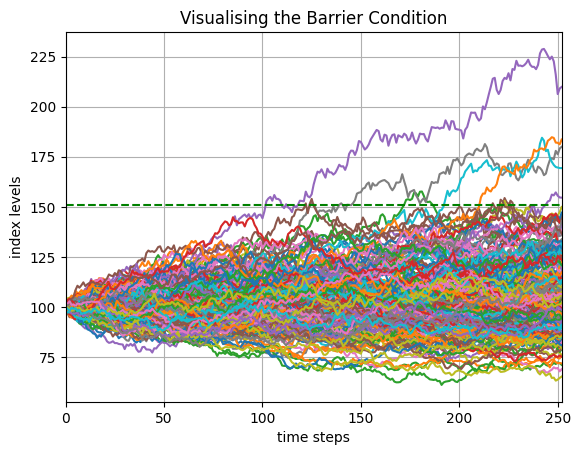

In [29]:
# Visualising the spot with barrier touch
plt.plot(S[:,:200])      
plt.grid(True)
plt.hlines(B_shift, 0, 252, colors='g', linestyles='dashed') 
plt.xlabel('time steps')
plt.xlim(0,252)
plt.ylabel('index levels')
plt.title('Visualising the Barrier Condition');

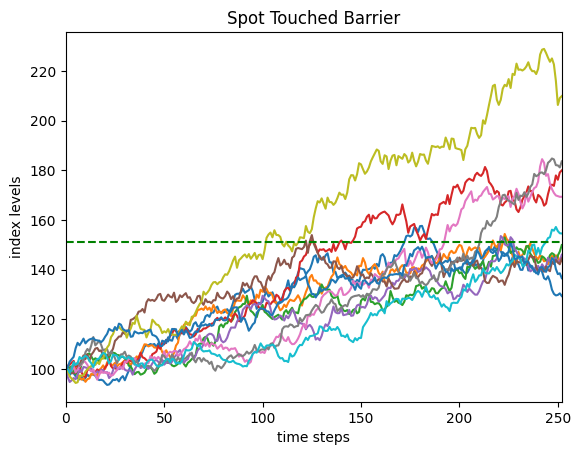

In [30]:
# Plot where S has touched the Barrier 
for i in range(200):
    if S[:,i].max() > B_shift:
        plt.plot(S[:,i])
        
plt.hlines(B_shift, 0, 252, colors='g', linestyles='dashed') 
plt.xlabel('time steps')
plt.xlim(0,252)
plt.ylabel('index levels')
plt.title('Spot Touched Barrier');

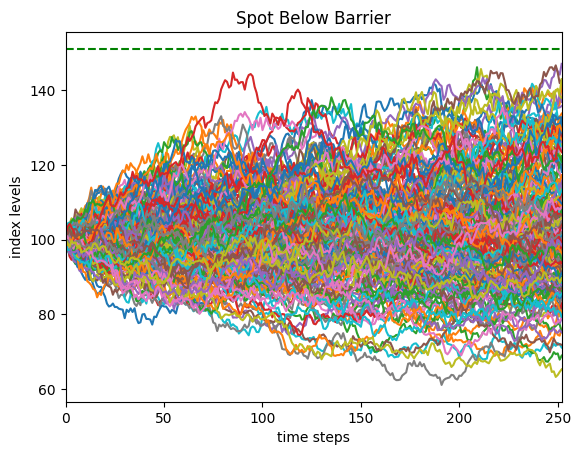

In [31]:
# Plot where S below the Barrier 
for i in range(200):
    if S[:,i].max() < B_shift:
        plt.plot(S[:,i])
        
plt.hlines(B_shift, 0, 252, colors='g', linestyles='dashed') 
plt.xlabel('time steps')
plt.xlim(0,252)
plt.ylabel('index levels')
plt.title('Spot Below Barrier');

## Lazy Recalculation Using Monte Carlo
The QuantLib-Python pricing engine allows us to use different pricing methods. The option doesn’t just recalculate every time anything changes; it also avoids recalculations when nothing has changed. We'll set the stochastic process to monte carlo engine for pricing options.

In [33]:
# import required libraries
from QuantLib import *

In [35]:
# Set US calendar
# us_calendar = UnitedStates()

# Setting valuation date to today
date = Date(24,8,2020)
Settings.instance().evaluationDate = date

# Define option instrument
option = EuropeanOption(PlainVanillaPayoff(Option.Call, 100), EuropeanExercise(Date(24,8,2021)))

# Underlying Price
u = SimpleQuote(100)

# Risk-free Rate
r = SimpleQuote(0.05)

# Sigma 
sigma = SimpleQuote(.20)

# Build flat curves and volatility
riskFreeCurve = FlatForward(0, TARGET(), QuoteHandle(r), Actual360()) 
volatility = BlackConstantVol(0, TARGET(), QuoteHandle(sigma), Actual360())

# Encapsulating the market data in a Black-Scholes process
process = BlackScholesProcess(QuoteHandle(u), 
                              YieldTermStructureHandle(riskFreeCurve),
                              BlackVolTermStructureHandle(volatility))

# Once we have the process, we can finally use it to build the engine…
MC_engine = MCEuropeanEngine(process, "PseudoRandom",
                             timeSteps=20,
                             antitheticVariate=True,
                             requiredSamples=250000)

# Set this engine to option instrument for evaluation
option.setPricingEngine(MC_engine)

MC engine stores the value and doesn't recalculate when there is no change in the input data. This is very powerful.

In [36]:
print(f'{option.NPV():0.4f}')

10.5211


In [37]:
# set price to 125
u.setValue(125.0)

print(f'{option.NPV():0.4f}')

30.8247


## References
* Paul Glasserman (2004), Monte Carlo Methods in Financial Engineering
* QuantLib Documentation: https://quantlib-python-docs.readthedocs.io/en/latest/index.html